<a href="https://colab.research.google.com/github/hussainqadiim/-/blob/main/Another_copy_of_Fork_of_Saudi_cars_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'saudi-arabia-used-cars-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1430609%2F2395181%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240215%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240215T145209Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D8c9baaf585f255e05a77fc483faabb8ff506ce3ab26fcef96ccf8c6ba2d1c3a82326345c4984073e70b9446c4ae2ee800b0230da2a80d6a912830034cfff9870a136efeaf4551ddcf1aad8f3fc620df4ddee50b66df6819b2219eb17a949804cf698107ed0a30a17a353eefa41819d2706d41591b8f43233eaada4c61392eeea31e0d5aeaa9d267f13c11040f87389ef14189fb7bec3bb1b1ec582cb2e24de08400e324ddbf4383a0d7f025e83b4d30fb2994bc8dc8603d07bb4521847ee135dec13b6ea97f57969ea4c9e2b19a2893b73fa5cb034fc1630573a5f376724d082f93c00bc3f75e01c0268f6b15cfb58a4de9921c4d1626e03f8a4e2a9a49c14b9'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 1404098 bytes downloaded
Downloaded and uncompressed: saudi-arabia-used-cars-dataset
Data source import complete.


###**Importing Modules and Predefined Functions**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, LabelEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from yellowbrick.regressor import PredictionError
from yellowbrick.features import RadViz
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso

%matplotlib inline

plt.rcParams["figure.figsize"] = (7,4)
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
#pd.set_option('display.width', 1000)
#pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [ ]:
#connecting to Google Drive
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
df = pd.read_csv('/kaggle/input/saudi-arabia-used-cars-dataset/UsedCarsSA_Clean_EN.csv')
df.head(10)

,Make,Type,Year,Origin,Color,Options,Engine_Size,Fuel_Type,Gear_Type,Mileage,Region,Price,Negotiable
0,Chrysler,C300,2018,Saudi,Black,Full,5.7,Gas,Automatic,103000,Riyadh,114000,False
1,Nissan,Patrol,2016,Saudi,White,Full,4.8,Gas,Automatic,5448,Riyadh,0,True
2,Nissan,Sunny,2019,Saudi,Silver,Standard,1.5,Gas,Automatic,72418,Riyadh,27500,False
3,Hyundai,Elantra,2019,Saudi,Grey,Standard,1.6,Gas,Automatic,114154,Riyadh,43000,False
4,Hyundai,Elantra,2019,Saudi,Silver,Semi Full,2.0,Gas,Automatic,41912,Riyadh,59500,False
5,Honda,Accord,2018,Saudi,Navy,Full,1.5,Gas,Automatic,39000,Riyadh,72000,False
6,Toyota,Land Cruiser,2011,Saudi,White,Semi Full,4.5,Gas,Automatic,183000,Riyadh,92000,False
7,GMC,Yukon,2009,Saudi,Bronze,Full,5.7,Gas,Automatic,323000,Riyadh,0,True
8,Chevrolet,Impala,2019,Saudi,Black,Standard,3.6,Gas,Automatic,70000,Riyadh,80000,False
9,Toyota,Yaris,2018,Saudi,White,Standard,1.5,Gas,Automatic,131000,Jeddah,32000,False


from matplotlib import pyplot as plt
_df_0['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Engine_Size'].plot(kind='hist', bins=20, title='Engine_Size')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('Make').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_5.groupby('Color').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_6.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_7.groupby('Region').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='Year', y='Engine_Size', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_9.plot(kind='scatter', x='Engine_Size', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_10.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Engine_Size']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Make')):
  _plot_series(series, series_name, i)
  fig.legend(title='Make', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Engine_Size')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Engine_Size']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_12.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Color')):
  _plot_series(series, series_name, i)
  fig.legend(title='Color', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Engine_Size')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Engine_Size']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_13.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Engine_Size')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Engine_Size']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_14.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Region')):
  _plot_series(series, series_name, i)
  fig.legend(title='Region', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Engine_Size')

from matplotlib import pyplot as plt
_df_15['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_16['Engine_Size'].plot(kind='line', figsize=(8, 4), title='Engine_Size')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_17['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_18['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Color'].value_counts()
    for x_label, grp in _df_19.groupby('Make')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Make')
_ = plt.ylabel('Color')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Options'].value_counts()
    for x_label, grp in _df_20.groupby('Color')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Color')
_ = plt.ylabel('Options')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Region'].value_counts()
    for x_label, grp in _df_21.groupby('Options')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Options')
_ = plt.ylabel('Region')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Negotiable'].value_counts()
    for x_label, grp in _df_22.groupby('Region')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Region')
_ = plt.ylabel('Negotiable')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_23['Make'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_23, x='Year', y='Make', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_24['Color'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_24, x='Year', y='Color', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_25['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_25, x='Year', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_26['Region'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_26, x='Year', y='Region', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8035 entries, 0 to 8034
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         8035 non-null   object 
 1   Type         8035 non-null   object 
 2   Year         8035 non-null   int64  
 3   Origin       8035 non-null   object 
 4   Color        8035 non-null   object 
 5   Options      8035 non-null   object 
 6   Engine_Size  8035 non-null   float64
 7   Fuel_Type    8035 non-null   object 
 8   Gear_Type    8035 non-null   object 
 9   Mileage      8035 non-null   int64  
 10  Region       8035 non-null   object 
 11  Price        8035 non-null   int64  
 12  Negotiable   8035 non-null   bool   
dtypes: bool(1), float64(1), int64(3), object(8)
memory usage: 761.3+ KB


In [ ]:
# Checking for missing values in the DataFrame 'df' and calculating the count of null values per column
df.isnull().sum()

Make           0
Type           0
Year           0
Origin         0
Color          0
Options        0
Engine_Size    0
Fuel_Type      0
Gear_Type      0
Mileage        0
Region         0
Price          0
Negotiable     0
dtype: int64

##**Data Cleaning & Exploratory Data Analysis**



In [ ]:
# Determine the 'Type' values that occur 50 times or less in the DataFrame 'df'
# and store these values' indices in 'drop_model'

drop_model = df.Type.value_counts()[df.Type.value_counts() <= 50].index
drop_model


Index(['C300', 'Malibu', 'Cadenza', 'Hiace', 'Rav4', 'LS', 'Land Cruiser 70',
       'Edge', 'Other', 'Sportage',
       ...
       'Camargue', 'Coupe S', 'Golf', 'Arnage', 'Patriot', 'LF X60', 'Crown',
       'Koranado', 'Prius', 'Galant'],
      dtype='object', length=334)

In [ ]:
# For each value 'i' in 'drop_model':
for i in drop_model:
    # Find the indices where the 'Type' column in the DataFrame 'df' matches the value 'i'
    drop_index = df[df['Type'] == i].index

    # Drop rows from 'df' based on the found indices
    df.drop(index=drop_index, inplace=True)

# Reset the indices of 'df' after dropping rows and make the changes permanent
df.reset_index(drop=True, inplace=True)


In [ ]:
df.Type.value_counts()

Land Cruiser           372
Camry                  329
Hilux                  290
Accent                 250
Yukon                  230
Tahoe                  218
Sonata                 213
Taurus                 205
Elantra                189
Corolla                171
Expedition             151
Furniture              129
Suburban               125
Accord                 119
ES                     117
LX                     110
S                      108
Patrol                 108
Prado                  105
Sunny                  105
Yaris                   96
Range Rover             93
Land Cruiser Pickup     93
Pajero                  90
Sierra                  88
Caprice                 87
FJ                      83
Innova                  81
Datsun                  80
Charger                 77
Explorer                71
C                       69
Senta fe                69
6                       66
Marquis                 66
Optima                  63
Azera                   63
H

In [ ]:
# Select columns with data type 'object' from the DataFrame 'df' and retrieve the first few rows

df_object = df.select_dtypes(include ="object").head()
df_object

,Make,Type,Origin,Color,Options,Fuel_Type,Gear_Type,Region
0,Nissan,Patrol,Saudi,White,Full,Gas,Automatic,Riyadh
1,Nissan,Sunny,Saudi,Silver,Standard,Gas,Automatic,Riyadh
2,Hyundai,Elantra,Saudi,Grey,Standard,Gas,Automatic,Riyadh
3,Hyundai,Elantra,Saudi,Silver,Semi Full,Gas,Automatic,Riyadh
4,Honda,Accord,Saudi,Navy,Full,Gas,Automatic,Riyadh


from matplotlib import pyplot as plt
import seaborn as sns
df_object.groupby('Make').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
df_object.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
df_object.groupby('Color').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
df_object.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Type'].value_counts()
    for x_label, grp in df_object.groupby('Make')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Make')
_ = plt.ylabel('Type')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Color'].value_counts()
    for x_label, grp in df_object.groupby('Type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Type')
_ = plt.ylabel('Color')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Options'].value_counts()
    for x_label, grp in df_object.groupby('Color')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Color')
_ = plt.ylabel('Options')

In [ ]:
for col in df_object:
    # Print the column name and the number of unique values in the corresponding column in the original DataFrame 'df'
    print(f"{col:<30}:", df[col].nunique())

Make                          : 16
Type                          : 47
Origin                        : 4
Color                         : 15
Options                       : 3
Fuel_Type                     : 3
Gear_Type                     : 2
Region                        : 27


In [ ]:
print(df.columns)

Index(['Make', 'Type', 'Year', 'Origin', 'Color', 'Options', 'Engine_Size',
       'Fuel_Type', 'Gear_Type', 'Mileage', 'Region', 'Price', 'Negotiable'],
      dtype='object')


In [ ]:
# Drop specific columns

df.drop(["Make","Origin","Color","Engine_Size","Gear_Type","Fuel_Type","Region","Negotiable"], axis=1, inplace=True)
df.head()

,Type,Year,Options,Mileage,Price
0,Patrol,2016,Full,5448,0
1,Sunny,2019,Standard,72418,27500
2,Elantra,2019,Standard,114154,43000
3,Elantra,2019,Semi Full,41912,59500
4,Accord,2018,Full,39000,72000


from matplotlib import pyplot as plt
_df_27['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_28['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_29['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_30.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_31.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_32.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_33.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_34.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_35.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_36.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_37.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_38['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_39['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_40['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Options'].value_counts()
    for x_label, grp in _df_41.groupby('Type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Type')
_ = plt.ylabel('Options')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_42['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_42, x='Year', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_43['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_43, x='Year', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_44['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_44, x='Mileage', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_45['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_45, x='Mileage', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
df.shape

(5557, 5)

In [ ]:
#filter the DataFrame 'df' to show rows where the 'Price' column has a value of 0

df[df.Price == 0]

,Type,Year,Options,Mileage,Price
0,Patrol,2016,Full,5448,0
6,Yukon,2009,Full,323000,0
15,Yukon,2018,Full,37000,0
21,Camry,2019,Full,8000,0
23,Avalon,2008,Full,169000,0
...,...,...,...,...,...
5548,CX9,2015,Standard,195000,0
5551,Explorer,2010,Semi Full,3275230,0
5552,Furniture,2020,Semi Full,82000,0
5554,Furniture,2014,Semi Full,497480,0


from matplotlib import pyplot as plt
_df_46['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_47['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_48.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_49.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_50.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_51.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_52.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Price']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Price'}, axis=1)
              .sort_values('Price', ascending=True))
  xs = counted['Price']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_53.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_54['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_55['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_56['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_56, x='Year', y='Options', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_57['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_57, x='Mileage', y='Options', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
# Filter the DataFrame 'df' to exclude rows where the 'Price' column equals 0
df = df[df['Price'] != 0]
df.head(10)

,Type,Year,Options,Mileage,Price
1,Sunny,2019,Standard,72418,27500
2,Elantra,2019,Standard,114154,43000
3,Elantra,2019,Semi Full,41912,59500
4,Accord,2018,Full,39000,72000
5,Land Cruiser,2011,Semi Full,183000,92000
7,Impala,2019,Standard,70000,80000
8,Yaris,2018,Standard,131000,32000
9,Camry,2017,Standard,107000,50000
10,Patrol,2014,Full,106000,135000
11,Tahoe,2018,Semi Full,176140,153000


from matplotlib import pyplot as plt
_df_58['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_59['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_60['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_61.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_62.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_63.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_64.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Price']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_65.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Price')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_66.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_67['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_68['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_69['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_70['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_70, x='Year', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_71['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_71, x='Mileage', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_72['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_72, x='Price', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
df.shape

(3763, 5)

In [ ]:
# Sort the DataFrame 'df' based on the 'Price' column in ascending order

df.sort_values(by='Price', ascending=1, inplace=True)
df.head(20)

,Type,Year,Options,Mileage,Price
5553,Yukon,2019,Full,50000,1
5260,Yaris,2018,Standard,100000,850
2526,Rio,2019,Standard,55500,884
5000,Yaris,2019,Standard,85000,950
5285,Elantra,2019,Standard,89000,993
2096,Yukon,2021,Standard,4000,1000
2945,Corolla,2020,Standard,48563,1002
2484,Sonata,2020,Standard,7000,1010
1480,Elantra,2020,Semi Full,27000,1010
4719,Corolla,2020,Semi Full,14000,1013


from matplotlib import pyplot as plt
_df_73['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_74['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_75['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_76.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_77.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_78.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_79.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_80.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_81.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_82.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_83.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_84['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_85['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_86['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Options'].value_counts()
    for x_label, grp in _df_87.groupby('Type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Type')
_ = plt.ylabel('Options')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_88['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_88, x='Year', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_89['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_89, x='Year', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_90['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_90, x='Mileage', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_91['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_91, x='Mileage', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
#drop the Price less than 5000
df = df[df['Price'] > 5000]
df.head(10)

,Type,Year,Options,Mileage,Price
861,Optima,2006,Standard,290000,6000
1431,Marquis,2001,Standard,350000,6000
4338,Suburban,1999,Standard,2500,6500
5363,Corolla,1997,Standard,32500,7000
2666,Sunny,2011,Standard,290,7000
4626,Explorer,2005,Standard,300000,7000
1347,Datsun,1984,Standard,248000,7000
4750,Elantra,2006,Full,10000,7000
609,Sunny,2000,Standard,120000,7000
3685,Explorer,2003,Standard,360000,8000


from matplotlib import pyplot as plt
_df_92['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_93['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_94['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_95.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_96.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_97.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_98.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_99.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_100.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_101.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_102.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_103['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_104['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_105['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Options'].value_counts()
    for x_label, grp in _df_106.groupby('Type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Type')
_ = plt.ylabel('Options')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_107['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_107, x='Year', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_108['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_108, x='Year', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_109['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_109, x='Mileage', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_110['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_110, x='Mileage', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
len(df[df.Price > 170000])

314

In [ ]:
#drop the Price more than 170000
df = df[df.Price < 170000]
df.head(10)

,Type,Year,Options,Mileage,Price
861,Optima,2006,Standard,290000,6000
1431,Marquis,2001,Standard,350000,6000
4338,Suburban,1999,Standard,2500,6500
5363,Corolla,1997,Standard,32500,7000
2666,Sunny,2011,Standard,290,7000
4626,Explorer,2005,Standard,300000,7000
1347,Datsun,1984,Standard,248000,7000
4750,Elantra,2006,Full,10000,7000
609,Sunny,2000,Standard,120000,7000
3685,Explorer,2003,Standard,360000,8000


from matplotlib import pyplot as plt
_df_111['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_112['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_113['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_114['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_115.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_116.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_117.plot(kind='scatter', x='index', y='Year', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_118.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_119.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_120.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_121.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_122.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_123.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
_df_124['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_125['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_126['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_127['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Options'].value_counts()
    for x_label, grp in _df_128.groupby('Type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Type')
_ = plt.ylabel('Options')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_129['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_129, x='index', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_130['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_130, x='index', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_131['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_131, x='Year', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_132['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_132, x='Year', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
#drop Mileage more than 700000
df = df[df['Mileage'] < 700000]
df.head(10)

,Type,Year,Options,Mileage,Price
861,Optima,2006,Standard,290000,6000
1431,Marquis,2001,Standard,350000,6000
4338,Suburban,1999,Standard,2500,6500
5363,Corolla,1997,Standard,32500,7000
2666,Sunny,2011,Standard,290,7000
4626,Explorer,2005,Standard,300000,7000
1347,Datsun,1984,Standard,248000,7000
4750,Elantra,2006,Full,10000,7000
609,Sunny,2000,Standard,120000,7000
3685,Explorer,2003,Standard,360000,8000


from matplotlib import pyplot as plt
_df_133['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_134['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_135['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_136.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_137.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_138.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_139.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_140.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_141.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_142.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_143.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_144['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_145['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_146['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Options'].value_counts()
    for x_label, grp in _df_147.groupby('Type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Type')
_ = plt.ylabel('Options')

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_148['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_148, x='Year', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_149['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_149, x='Year', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_150['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_150, x='Mileage', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_151['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_151, x='Mileage', y='Options', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,3357.0,2014.636878,4.829401,1964.0,2013.0,2016.0,2018.0,2021.0
Mileage,3357.0,139371.786119,111485.816608,100.0,62500.0,112972.0,198506.0,650000.0
Price,3357.0,63790.587429,36334.593278,6000.0,36000.0,55000.0,82000.0,169500.0


from matplotlib import pyplot as plt
_df_152['mean'].plot(kind='hist', bins=20, title='mean')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_153['std'].plot(kind='hist', bins=20, title='std')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_154['min'].plot(kind='hist', bins=20, title='min')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_155['25%'].plot(kind='hist', bins=20, title='25%')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_156.plot(kind='scatter', x='mean', y='std', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_157.plot(kind='scatter', x='std', y='min', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_158.plot(kind='scatter', x='min', y='25%', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_159.plot(kind='scatter', x='25%', y='50%', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['count']
  ys = series['mean']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_160.sort_values('count', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('count')
_ = plt.ylabel('mean')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['count']
  ys = series['std']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_161.sort_values('count', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('count')
_ = plt.ylabel('std')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['count']
  ys = series['min']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_162.sort_values('count', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('count')
_ = plt.ylabel('min')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['count']
  ys = series['25%']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_163.sort_values('count', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('count')
_ = plt.ylabel('25%')

from matplotlib import pyplot as plt
_df_164['mean'].plot(kind='line', figsize=(8, 4), title='mean')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_165['std'].plot(kind='line', figsize=(8, 4), title='std')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_166['min'].plot(kind='line', figsize=(8, 4), title='min')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_167['25%'].plot(kind='line', figsize=(8, 4), title='25%')
plt.gca().spines[['top', 'right']].set_visible(False)

## **Data Visualization**

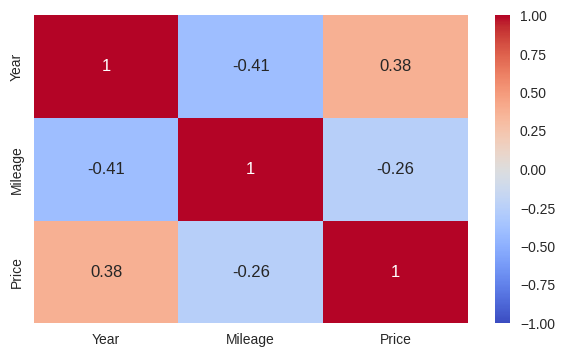

In [ ]:
sns.heatmap(df.select_dtypes(include='number').corr(), annot=True, vmin=-1, vmax=1, cmap="coolwarm")
plt.show()

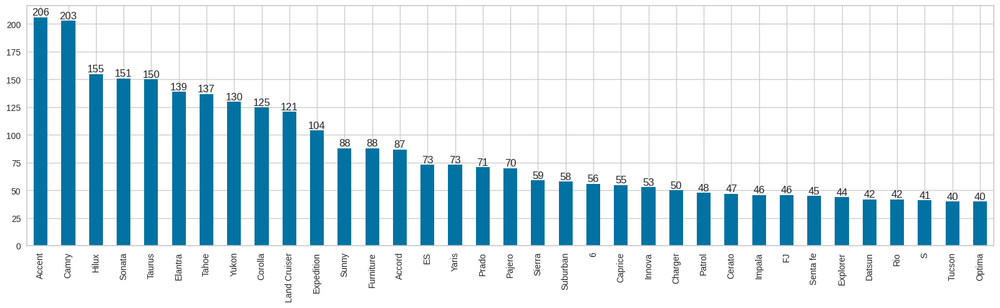

In [ ]:
ax = df.Type.value_counts().iloc[:35].plot(kind ="bar", figsize=(20,5))

ax.bar_label(ax.containers[0]);

# we see the top models with the most observations in our data and their numbers.

In [ ]:
# Calculate the age of vehicles by subtracting the 'Year' column values from 2023
df["vehicle_age"]=2023-df.Year

In [ ]:
df.head()

,Type,Year,Options,Mileage,Price,vehicle_age
861,Optima,2006,Standard,290000,6000,17
1431,Marquis,2001,Standard,350000,6000,22
4338,Suburban,1999,Standard,2500,6500,24
5363,Corolla,1997,Standard,32500,7000,26
2666,Sunny,2011,Standard,290,7000,12


from matplotlib import pyplot as plt
_df_168['Year'].plot(kind='hist', bins=20, title='Year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_169['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_170['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_171['vehicle_age'].plot(kind='hist', bins=20, title='vehicle_age')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_172.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_173.plot(kind='scatter', x='Year', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_174.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_175.plot(kind='scatter', x='Price', y='vehicle_age', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_176.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Year']
  ys = series['vehicle_age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_177.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('vehicle_age')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_178.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_179.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
_df_180['Year'].plot(kind='line', figsize=(8, 4), title='Year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_181['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_182['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_183['vehicle_age'].plot(kind='line', figsize=(8, 4), title='vehicle_age')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_184['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_184, x='Year', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_185['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_185, x='Mileage', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_186['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_186, x='Price', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_187['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_187, x='vehicle_age', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
# Drop the 'Year' column from the DataFrame 'df' along the columns axis
df.drop("Year", axis=1, inplace=True)

In [ ]:
df.head()

,Type,Options,Mileage,Price,vehicle_age
861,Optima,Standard,290000,6000,17
1431,Marquis,Standard,350000,6000,22
4338,Suburban,Standard,2500,6500,24
5363,Corolla,Standard,32500,7000,26
2666,Sunny,Standard,290,7000,12


from matplotlib import pyplot as plt
_df_188['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_189['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_190['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_191['vehicle_age'].plot(kind='hist', bins=20, title='vehicle_age')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_192.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_193.plot(kind='scatter', x='index', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_194.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_195.plot(kind='scatter', x='Price', y='vehicle_age', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_196.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_197.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['vehicle_age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_198.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('vehicle_age')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Price']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Price'}, axis=1)
              .sort_values('Price', ascending=True))
  xs = counted['Price']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_199.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_200['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_201['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_202['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_203['vehicle_age'].plot(kind='line', figsize=(8, 4), title='vehicle_age')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_204['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_204, x='index', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_205['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_205, x='Mileage', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_206['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_206, x='Price', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_207['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_207, x='vehicle_age', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
df.select_dtypes("object").head()

,Type,Options
861,Optima,Standard
1431,Marquis,Standard
4338,Suburban,Standard
5363,Corolla,Standard
2666,Sunny,Standard


from matplotlib import pyplot as plt
import seaborn as sns
_df_208.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
for i in df.select_dtypes("object"):

    print(i, len(df[i].value_counts()))

Type 47
Options 3


# Split Data

In [ ]:
X=df.drop("Price", axis=1)
y=df.Price

In [ ]:

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2, random_state=5)

print("Train features shape : ", X_train.shape)
print("Train target shape   : ", y_train.shape)
print("Test features shape  : ", X_test.shape)
print("Test target shape    : ", y_test.shape)

Train features shape :  (2685, 4)
Train target shape   :  (2685,)
Test features shape  :  (672, 4)
Test target shape    :  (672,)


In [ ]:
cat = X.select_dtypes("object").columns
cat

Index(['Type', 'Options'], dtype='object')

In [ ]:

column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat),
    remainder=MinMaxScaler(),
    verbose_feature_names_out=False,
)

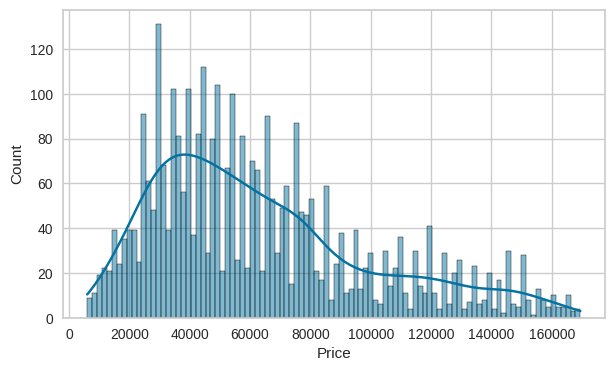

In [ ]:
sns.histplot(df.Price, bins=100, kde=True);

In [ ]:
total_outliers = []

for model in df.Type.unique():

    car_prices = df[df["Type"]== model]["Price"]

    Q1 = car_prices.quantile(0.25)
    Q3 = car_prices.quantile(0.75)
    IQR = Q3 - Q1
    lower_lim = Q1 - 1.5*IQR
    upper_lim = Q3 + 1.5*IQR

    count_of_outliers = (car_prices[(car_prices < lower_lim) | (car_prices > upper_lim)]).count()

    total_outliers.append(count_of_outliers)

    print(f" The count of outlier for {model:<24} : {count_of_outliers:<2},\
    The rate of outliers : {(count_of_outliers/len(df[df['Type']== model])).round(3)}")
print()
print("Total_outliers : ",sum(total_outliers), "The rate of total outliers :", (sum(total_outliers)/len(df)).round(3))

 The count of outlier for Optima                   : 3 ,    The rate of outliers : 0.075
 The count of outlier for Marquis                  : 2 ,    The rate of outliers : 0.069
 The count of outlier for Suburban                 : 0 ,    The rate of outliers : 0.0
 The count of outlier for Corolla                  : 4 ,    The rate of outliers : 0.032
 The count of outlier for Sunny                    : 10,    The rate of outliers : 0.114
 The count of outlier for Explorer                 : 0 ,    The rate of outliers : 0.0
 The count of outlier for Datsun                   : 0 ,    The rate of outliers : 0.0
 The count of outlier for Elantra                  : 8 ,    The rate of outliers : 0.058
 The count of outlier for Sierra                   : 0 ,    The rate of outliers : 0.0
 The count of outlier for E                        : 4 ,    The rate of outliers : 0.143
 The count of outlier for Rio                      : 1 ,    The rate of outliers : 0.024
 The count of outlier for Acc

In [ ]:
df

,Type,Options,Mileage,Price,vehicle_age
861,Optima,Standard,290000,6000,17
1431,Marquis,Standard,350000,6000,22
4338,Suburban,Standard,2500,6500,24
5363,Corolla,Standard,32500,7000,26
2666,Sunny,Standard,290,7000,12
...,...,...,...,...,...
924,Range Rover,Full,87000,167000,7
4631,Tahoe,Semi Full,32300,168000,4
287,Tahoe,Full,55000,168000,6
5221,S,Full,179000,169000,9


from matplotlib import pyplot as plt
_df_209['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_210['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_211['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_212['vehicle_age'].plot(kind='hist', bins=20, title='vehicle_age')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_213.groupby('Options').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_214.plot(kind='scatter', x='index', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_215.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_216.plot(kind='scatter', x='Price', y='vehicle_age', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_217.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_218.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['vehicle_age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_219.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('vehicle_age')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Price']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Price'}, axis=1)
              .sort_values('Price', ascending=True))
  xs = counted['Price']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_220.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Options')):
  _plot_series(series, series_name, i)
  fig.legend(title='Options', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_221['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_222['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_223['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_224['vehicle_age'].plot(kind='line', figsize=(8, 4), title='vehicle_age')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_225['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_225, x='index', y='Options', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_226['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_226, x='Mileage', y='Options', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_227['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_227, x='Price', y='Options', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_228['Options'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_228, x='vehicle_age', y='Options', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
print('Duplicated Rows : ', df.duplicated().sum())

Duplicated Rows :  12


In [ ]:
df = df.drop_duplicates()


In [ ]:
print('Remaining Duplicated Rows:', df.duplicated().sum())

Remaining Duplicated Rows: 0


In [ ]:
print('Missing Value   : ', df.isna().sum().sum())

Missing Value   :  0


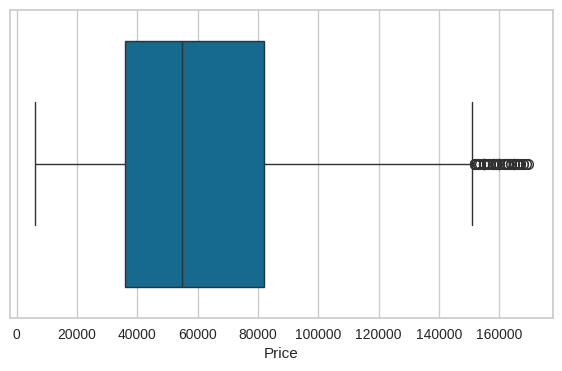

In [ ]:


# Assuming 'df' is your DataFrame
sns.boxplot(x=df['Price'])

# Display the plot
plt.show()

## Data Pre-Processing

In [ ]:
cat_onehot = ['Type']

cat_ordinal = ['Options']
cat_for_Options = ["Standard" , "Semi Full" ,"Full"]

In [ ]:
df['Options'].unique()

array(['Standard', 'Full', 'Semi Full'], dtype=object)

In [ ]:


# Assuming cat_onehot, cat_ordinal, and cat_for_Options are defined elsewhere

# Initialize the scaler
scaler = MinMaxScaler()

column_trans = make_column_transformer(
    (OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot),
    (OrdinalEncoder(categories=[cat_for_Options]), cat_ordinal),
    (scaler, ['Mileage', 'vehicle_age']),
    remainder='passthrough',
    verbose_feature_names_out=False
)

# Setting output transformation to pandas dataframe
column_trans = column_trans.set_output(transform="pandas")


In [ ]:
column_trans.fit_transform(X_train).head()

,Type_6,Type_Accent,Type_Accord,Type_Avalon,Type_Azera,Type_C,Type_CX9,Type_Camry,Type_Caprice,Type_Cerato,Type_Charger,Type_Corolla,Type_Datsun,Type_E,Type_ES,Type_Elantra,Type_Expedition,Type_Explorer,Type_FJ,Type_Furniture,Type_H1,Type_Hilux,Type_Impala,Type_Innova,Type_LX,Type_Land Cruiser,Type_Land Cruiser Pickup,Type_Marquis,Type_Optima,Type_Pajero,Type_Patrol,Type_Prado,Type_Range Rover,Type_Rio,Type_S,Type_Senta fe,Type_Sierra,Type_Sonata,Type_Suburban,Type_Sunny,Type_Tahoe,Type_Taurus,Type_The 7,Type_Tucson,Type_Victoria,Type_Yaris,Type_Yukon,Options,Mileage,vehicle_age
5355,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.213725,0.087719
5160,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.241422,0.070175
2713,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000434,0.228070
2336,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.212186,0.052632
472,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.250654,0.122807


In [ ]:
X_train_trans = column_trans.fit_transform(X_train)
X_test_trans = column_trans.transform(X_test)

In [ ]:
X_train_trans.shape, X_test_trans.shape

((2685, 50), (672, 50))

In [ ]:
X_train_trans.join(y_train).corr()

,Type_6,Type_Accent,Type_Accord,Type_Avalon,Type_Azera,Type_C,Type_CX9,Type_Camry,Type_Caprice,Type_Cerato,Type_Charger,Type_Corolla,Type_Datsun,Type_E,Type_ES,Type_Elantra,Type_Expedition,Type_Explorer,Type_FJ,Type_Furniture,Type_H1,Type_Hilux,Type_Impala,Type_Innova,Type_LX,Type_Land Cruiser,Type_Land Cruiser Pickup,Type_Marquis,Type_Optima,Type_Pajero,Type_Patrol,Type_Prado,Type_Range Rover,Type_Rio,Type_S,Type_Senta fe,Type_Sierra,Type_Sonata,Type_Suburban,Type_Sunny,Type_Tahoe,Type_Taurus,Type_The 7,Type_Tucson,Type_Victoria,Type_Yaris,Type_Yukon,Options,Mileage,vehicle_age,Price
Type_6,1.000000,-0.035475,-0.023190,-0.014141,-0.015600,-0.013884,-0.014888,-0.034791,-0.017574,-0.015129,-0.016940,-0.026811,-0.015366,-0.012230,-0.019358,-0.027651,-0.024907,-0.015366,-0.016505,-0.022037,-0.014141,-0.031447,-0.016940,-0.017365,-0.009608,-0.027093,-0.014141,-0.012804,-0.014141,-0.019920,-0.016505,-0.019735,-0.011629,-0.015129,-0.014888,-0.016724,-0.019168,-0.029665,-0.018781,-0.022866,-0.028606,-0.030183,-0.010665,-0.015129,-0.013884,-0.020648,-0.027789,-0.040743,-0.029244,-0.055208,-0.024010
Type_Accent,-0.035475,1.000000,-0.043355,-0.026437,-0.029165,-0.025956,-0.027833,-0.065043,-0.032855,-0.028284,-0.031670,-0.050124,-0.028728,-0.022865,-0.036192,-0.051696,-0.046564,-0.028728,-0.030856,-0.041199,-0.026437,-0.058792,-0.031670,-0.032464,-0.017963,-0.050652,-0.026437,-0.023938,-0.026437,-0.037242,-0.030856,-0.036895,-0.021741,-0.028284,-0.027833,-0.031266,-0.035835,-0.055459,-0.035112,-0.042749,-0.053480,-0.056428,-0.019940,-0.028284,-0.025956,-0.038602,-0.051954,-0.218109,-0.082840,-0.158234,-0.221267
Type_Accord,-0.023190,-0.043355,1.000000,-0.017282,-0.019065,-0.016967,-0.018195,-0.042519,-0.021477,-0.018489,-0.020703,-0.032766,-0.018779,-0.014947,-0.023659,-0.033794,-0.030439,-0.018779,-0.020171,-0.026932,-0.017282,-0.038432,-0.020703,-0.021222,-0.011743,-0.033112,-0.017282,-0.015648,-0.017282,-0.024345,-0.020171,-0.024118,-0.014212,-0.018489,-0.018195,-0.020439,-0.023426,-0.036254,-0.022953,-0.027945,-0.034960,-0.036887,-0.013035,-0.018489,-0.016967,-0.025234,-0.033962,0.054634,-0.015261,-0.016387,0.008128
Type_Avalon,-0.014141,-0.026437,-0.017282,1.000000,-0.011626,-0.010346,-0.011095,-0.025927,-0.013096,-0.011274,-0.012624,-0.019980,-0.011451,-0.009114,-0.014426,-0.020607,-0.018561,-0.011451,-0.012300,-0.016422,-0.010538,-0.023435,-0.012624,-0.012941,-0.007160,-0.020191,-0.010538,-0.009542,-0.010538,-0.014845,-0.012300,-0.014707,-0.008666,-0.011274,-0.011095,-0.012463,-0.014284,-0.022107,-0.013996,-0.017040,-0.021318,-0.022493,-0.007948,-0.011274,-0.010346,-0.015387,-0.020709,0.012971,0.002667,-0.019764,0.061950
Type_Azera,-0.015600,-0.029165,-0.019065,-0.011626,1.000000,-0.011414,-0.012240,-0.028602,-0.014448,-0.012438,-0.013927,-0.022042,-0.012633,-0.010055,-0.015915,-0.022733,-0.020477,-0.012633,-0.013569,-0.018117,-0.011626,-0.025854,-0.013927,-0.014276,-0.007899,-0.022274,-0.011626,-0.010527,-0.011626,-0.016377,-0.013569,-0.016224,-0.009561,-0.012438,-0.012240,-0.013749,-0.015758,-0.024388,-0.015440,-0.018799,-0.023518,-0.024814,-0.008768,-0.012438,-0.011414,-0.016975,-0.022846,0.029274,-0.010070,-0.045361,0.000743
Type_C,-0.013884,-0.025956,-0.016967,-0.010346,-0.011414,1.000000,-0.010893,-0.025455,-0.012858,-0.011069,-0.012394,-0.019616,-0.011243,-0.008948,-0.014164,-0.020231,-0.018223,-0.011243,-0.012076,-0.016123,-0.010346,-0.023009,-0.012394,-0.012705,-0.007030,-0.019823,-0.010346,-0.009368,-0.010346,-0.014575,-0.012076,-0.014439,-0.008508,-0.011069,-0.010893,-0.012236,-0.014024,-0.021704,-0.013741,-0.016730,-0.020930,-0.022083,-0.007804,-0.011069,-0.010158,-0.015107,-0.020332,0.079341,-0.035489,-0.031195,0.151016
Type_CX9,-0.014888,-0.027833,-0.018195,-0.011095,-0.012240,-0.010893,1.000000,-0.027296,-0.013788,-0.011870,-0.013291,-0.021035,-0.012056,-0.009596,-0.015188,-0.021695,-0.019541,-0.012056,-0.012949,-0.017290,-0.011095,-0.024673,-0.013291,-0.013624,-0.007538,-0.021257,-0.011095,-0.010046,-0.011095,-0.0

# Model Building

In [ ]:
def train_val(model, X_train, y_train, X_test, y_test):

    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    scores = {"train": {"R2" : r2_score(y_train, y_train_pred),
                        "mae" : mean_absolute_error(y_train, y_train_pred),
                        "mse" : mean_squared_error(y_train, y_train_pred),
                        "rmse" : mean_squared_error(y_train, y_train_pred, squared=False)},
              "test": {"R2" : r2_score(y_test, y_pred),
                       "mae" : mean_absolute_error(y_test, y_pred),
                       "mse" : mean_squared_error(y_test, y_pred),
                       "rmse" : mean_squared_error(y_test, y_pred, squared=False)}}

    return pd.DataFrame(scores)

In [ ]:


LR_model = LinearRegression()
operations = [("preprocess", column_trans),
              ("Linear", LinearRegression())]

LR_pipeline = Pipeline(steps=operations)
LR_pipeline.fit(X_train, y_train)

y_pred = LR_pipeline.predict(X_test)

In [ ]:
train_val(LR_pipeline, X_train, y_train, X_test, y_test)

,train,test
R2,7.629568e-01,7.985234e-01
mae,1.196323e+04,1.169966e+04
mse,3.067417e+08,2.862473e+08
rmse,1.751404e+04,1.691884e+04


from matplotlib import pyplot as plt
_df_229['train'].plot(kind='hist', bins=20, title='train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_230['test'].plot(kind='hist', bins=20, title='test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_231.groupby('index').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_232.plot(kind='scatter', x='train', y='test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_233['train'].plot(kind='line', figsize=(8, 4), title='train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_234['test'].plot(kind='line', figsize=(8, 4), title='test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_235['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_235, x='train', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_236['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_236, x='test', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

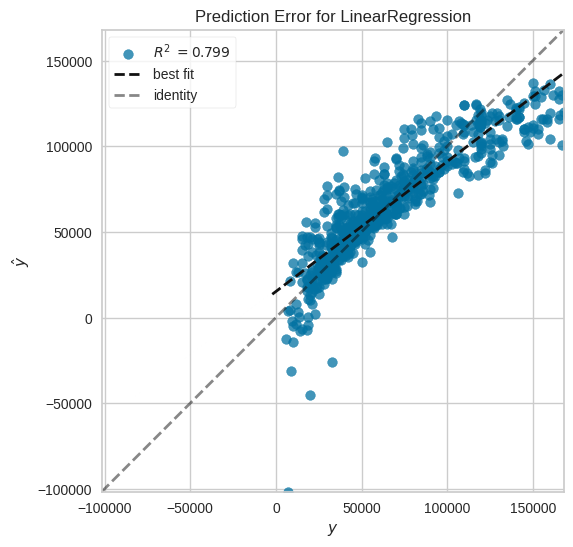

In [ ]:



visualizer = RadViz(size=(720, 600))

LR_model = LR_pipeline
visualizer = PredictionError(LR_pipeline)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show();

In [ ]:
operations = [("preprocess", column_trans), ("Lasso", Lasso())]

lasso_model = Pipeline(steps=operations)

lasso_model.fit(X_train, y_train)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Type']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Standard',
                                                                              'Semi '
                                                                              'Full',
                                                                              'Full']]),
                                                  ['Options']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['Mileage', 'vehicle_age'])],
                                   verbose_feature_names_out=False)),
                ('Lasso', Lasso())])

In [ ]:
train_val(lasso_model, X_train, y_train, X_test, y_test)

,train,test
R2,7.629537e-01,7.983040e-01
mae,1.196522e+04,1.170712e+04
mse,3.067459e+08,2.865591e+08
rmse,1.751416e+04,1.692806e+04


from matplotlib import pyplot as plt
_df_237['train'].plot(kind='hist', bins=20, title='train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_238['test'].plot(kind='hist', bins=20, title='test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_239.groupby('index').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_240.plot(kind='scatter', x='train', y='test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_241['train'].plot(kind='line', figsize=(8, 4), title='train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_242['test'].plot(kind='line', figsize=(8, 4), title='test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_243['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_243, x='train', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_244['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_244, x='test', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
pip install xgboost

In [ ]:


xgb_model = XGBRegressor()

operations = [("preprocess", column_trans),('xgb_model', xgb_model) ]

XGB_pipeline = Pipeline(steps=operations)

XGB_pipeline.fit(X_train, y_train)





Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Type']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Standard',
                                                                              'Semi '
                                                                              'Full',
                                                                              'Full']]),
                                                  ['Options']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['Mileage', 'vehicle_age'])],
                                   verbose_feature_names_out=False))...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [ ]:
train_val(XGB_pipeline, X_train, y_train, X_test, y_test)

,train,test
R2,9.726442e-01,9.063805e-01
mae,4.202338e+03,7.816795e+03
mse,3.539930e+07,1.330096e+08
rmse,5.949731e+03,1.153298e+04


from matplotlib import pyplot as plt
_df_245['train'].plot(kind='hist', bins=20, title='train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_246['test'].plot(kind='hist', bins=20, title='test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_247.groupby('index').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_248.plot(kind='scatter', x='train', y='test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_249['train'].plot(kind='line', figsize=(8, 4), title='train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_250['test'].plot(kind='line', figsize=(8, 4), title='test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_251['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_251, x='train', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_252['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_252, x='test', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:


RF_model = RandomForestRegressor()

operations = [("preprocess", column_trans),("RF_model", RandomForestRegressor(random_state=101)) ]

RF_pipeline = Pipeline(steps=operations)

RF_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Type']),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Standard',
                                                                              'Semi '
                                                                              'Full',
                                                                              'Full']]),
                                                  ['Options']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['Mileage', 'vehicle_age'])],
                                   verbose_feature_names_out=False)),
                ('RF_model', RandomForestRegressor(random_state=101))])

In [ ]:
train_val(RF_pipeline, X_train, y_train, X_test, y_test)

,train,test
R2,9.789434e-01,8.841501e-01
mae,3.389014e+03,8.804216e+03
mse,2.724788e+07,1.645934e+08
rmse,5.219951e+03,1.282940e+04


from matplotlib import pyplot as plt
_df_253['train'].plot(kind='hist', bins=20, title='train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_254['test'].plot(kind='hist', bins=20, title='test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_255.groupby('index').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_256.plot(kind='scatter', x='train', y='test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_257['train'].plot(kind='line', figsize=(8, 4), title='train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_258['test'].plot(kind='line', figsize=(8, 4), title='test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_259['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_259, x='train', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_260['index'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_260, x='test', y='index', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

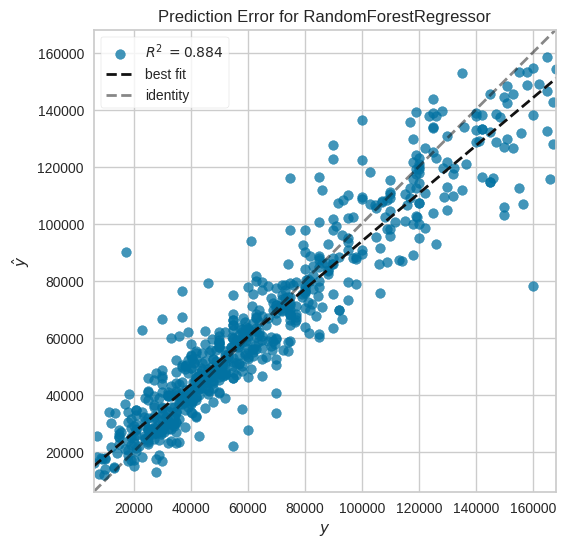

In [ ]:


visualizer = RadViz(size=(720, 600))

RF_model = RF_pipeline
visualizer = PredictionError(RF_model)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show(); # Values bigger than 300000 effect our predictions.

#  Prediction

In [ ]:
df_new = df[df.Price < 200000]
df_new.head()

,Type,Options,Mileage,Price,vehicle_age
861,Optima,Standard,290000,6000,17
1431,Marquis,Standard,350000,6000,22
4338,Suburban,Standard,2500,6500,24
5363,Corolla,Standard,32500,7000,26
2666,Sunny,Standard,290,7000,12


from matplotlib import pyplot as plt
_df_261['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_262['Mileage'].plot(kind='hist', bins=20, title='Mileage')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_263['Price'].plot(kind='hist', bins=20, title='Price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_264['vehicle_age'].plot(kind='hist', bins=20, title='vehicle_age')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_265.groupby('Type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_266.plot(kind='scatter', x='index', y='Mileage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_267.plot(kind='scatter', x='Mileage', y='Price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_268.plot(kind='scatter', x='Price', y='vehicle_age', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_269.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['Mileage']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_270.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('Mileage')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Price']
  ys = series['vehicle_age']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_271.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('vehicle_age')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Price']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Price'}, axis=1)
              .sort_values('Price', ascending=True))
  xs = counted['Price']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_272.sort_values('Price', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Type')):
  _plot_series(series, series_name, i)
  fig.legend(title='Type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Price')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_273['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_274['Mileage'].plot(kind='line', figsize=(8, 4), title='Mileage')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_275['Price'].plot(kind='line', figsize=(8, 4), title='Price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_276['vehicle_age'].plot(kind='line', figsize=(8, 4), title='vehicle_age')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_277['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_277, x='index', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_278['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_278, x='Mileage', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_279['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_279, x='Price', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_280['Type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_280, x='vehicle_age', y='Type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
X = df_new.drop(columns="Price")
y = df_new.Price

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [ ]:
import pickle

# Assuming XGB_pipeline is your trained XGBoost pipeline
LR_model = 'LR_model.pkl'

with open(LR_model, 'wb') as file:
    pickle.dump(LR_pipeline, file)


In [ ]:
data = {
    'Type': ['Camry', 'Tahoe', 'Hilux'],
    'Options': ['Full', 'Standard', 'Full'],
    'Mileage': [125000 , 81833 , 190000],
    'vehicle_age': [4 , 4 , 3]

}

new_test_data = pd.DataFrame(data)

In [ ]:
#LG_model

import pickle

# Load the saved model
LR_model = 'LR_model.pkl'

with open(LR_model, 'rb') as file:
    loaded_model = pickle.load(file)


In [ ]:
predictions = loaded_model.predict(new_test_data)

# Print the predicted prices
print("Predicted Prices:")
for prediction in predictions:
    print(prediction)

Predicted Prices:
80109.58066728686
113322.79261415466
92092.03531773854
